# Analysis of Precipitation and Correlation with Air Quality Index in Pune: A Comprehensive Study for the Year 2022

## Introduction
**Pune, known for its rapid urbanization and diverse climatic conditions, faces significant challenges related to climate change and air pollution.This study focuses on understanding the patterns of precipitation, AQI, temparature, humidity in Pune during 2022, including the distribution, intensity, and similarity of rainfall,that will provide valuable information for assessing the city's vulnerability to air pollution.**

**By combining the historical data for precipitation from 10 sensors and AQI,collected from 60 sensors across the city, this study also aims to provide valuable insights into the interplay between these two factors and their potential implications for the city's environment.By examining the weather data for Pune in 2022, this analysis uncovers the seasonal trends in correlation with precipitation patterns.Starting from annual correlation over the whole city, we dived deep into holiday wise correlation on each part of Pune city with help of advanced krigging interpolation to store spatial variation of data and advanced visualizations, like color coded voronoi diagrams, contour plots and folium maps.Our analysis could extract the hidden negative correlation between AQI and precipitation in majority of the places in Pune which implies the impact of rainfall to get a control over the increasing AQI trend.**

**This study also finds out the primary source of air pollution in Pune to be vehicular pollution as a result from the correlation analysis.**

**The aim of this work is to provide valuable insights that may help urban policy makers for the development of sustainable strategies to mitigate air pollution and improve public health in Pune.**

## Imports

In [1]:
import folium
from folium import plugins
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import random
from datetime import datetime, timedelta
from matplotlib import colors
from matplotlib.ticker import PercentFormatter
import ipywidgets as widgets
from ipywidgets import Layout
from scipy.interpolate import griddata
import geojsoncontour
import matplotlib.dates as mdates
import json
import dcor
from sklearn.preprocessing import MinMaxScaler
import warnings
warnings.filterwarnings('ignore')
import shapely
from shapely.geometry.polygon import Polygon
from shapely.ops import cascaded_union
import geopandas as gpd
from shapely.geometry import Point, LineString, Polygon
from geovoronoi import voronoi_regions_from_coords, points_to_coords
import sklearn
from skgstat import Variogram
import pykrige
from pykrige.ok import OrdinaryKriging
from scipy.interpolate import Rbf, interp2d
import calendar

## Location of Weather Stations Across Pune

In [2]:
df = pd.read_json("pune-env-weather.txt")

### Preprocess metadata

In [3]:
# Gathering locations from the metadata
df['coordinates'] = [str(df['location'][i]['geometry']['coordinates']) for i in range(10)]

# Read Latitudes and Longitudes
df['latitude']=df['coordinates'].apply(lambda x:float(x.split(",")[1][:-1].strip()))
df['longitude']=df['coordinates'].apply(lambda x:float(x.split(",")[0][1:].strip()))

#Dropping unnecessary columns
df = df.drop(['@context','type','label','description','tags','itemStatus','resourceGroup','provider','instance','_geosummary','location'], axis = 1)

### Spatial visualization using Foilum

In [4]:
loc_map=folium.Map([18.4,73.6])
for i in range(0,10):
    folium.Marker([df['latitude'][i],df['longitude'][i]]).add_to(loc_map)
loc_map

***There is data collected from 10 weather stations in Pune***

## Weather Data of Pune 2022

In [5]:
# Reading data from local system
data = pd.read_csv("data1.csv").iloc[78025:151434].reset_index(drop=True)

### Preprocess Data

In [6]:
# Drop unnecessary columns
data = data.drop(["relativeHumidity","airTemperature","uv","airQualityIndexForecast","aqiMajorPollutantForecast","airTemperatureForecast","aqiMajorPollutant","relativeHumidityForecast"], axis = 1)

# Date Time Format
data["observationDateTime"]=data['observationDateTime'].apply(lambda x:datetime.strptime(str(x),'%Y-%m-%d %H:%M:%S%z'))
data["observationDateTime"]=data['observationDateTime'].apply(lambda x:x.tz_localize(None))

In [7]:
# Summarizing the data
dtypes = pd.DataFrame(data.dtypes,columns=["Data Type"])
dtypes["Unique Values"]=data.nunique()
dtypes["Null Values"]=data.isnull().sum()
dtypes["% null Values"]=data.isnull().sum()/len(data)
dtypes.sort_values(by="Null Values" , ascending=False).style.background_gradient(cmap='YlOrRd',axis=0)

,Data Type,Unique Values,Null Values,% null Values
uv.avgOverTime,float64,2353,59411,0.809315
airTemperature.avgOverTime,float64,3727,28867,0.393235
relativeHumidity.avgOverTime,float64,8108,23521,0.320410
precipitation,float64,83,19941,0.271642
precipitationForecast,float64,214,14682,0.200003
airQualityIndex,float64,428,352,0.004795
id,object,10,0,0.000000
observationDateTime,datetime64[ns],7341,0,0.000000
deviceName,object,10,0,0.000000


### Adding sensor location information to the weather dataframe

In [8]:
data['latitude'] = data['id'].apply(lambda x: df.loc[df['id'] == x, 'latitude'].values[0] if x in df['id'].values else '')
data['longitude'] = data['id'].apply(lambda x: df.loc[df['id'] == x, 'longitude'].values[0] if x in df['id'].values else '')

In [9]:
# Replacing Blank values with Nan
data = data.replace(r'^\s*$', np.nan, regex=True)

## Daily Precipitation, AQI, Temperature & Humidity Analysis

In [10]:
# Format Date-Time data to Date
data['observationDateTime'] = data['observationDateTime'].apply(lambda x: x.date())

### Visualizing the Trend of Precipitation, AQI , HUmidity and Temparature Throughout the Year

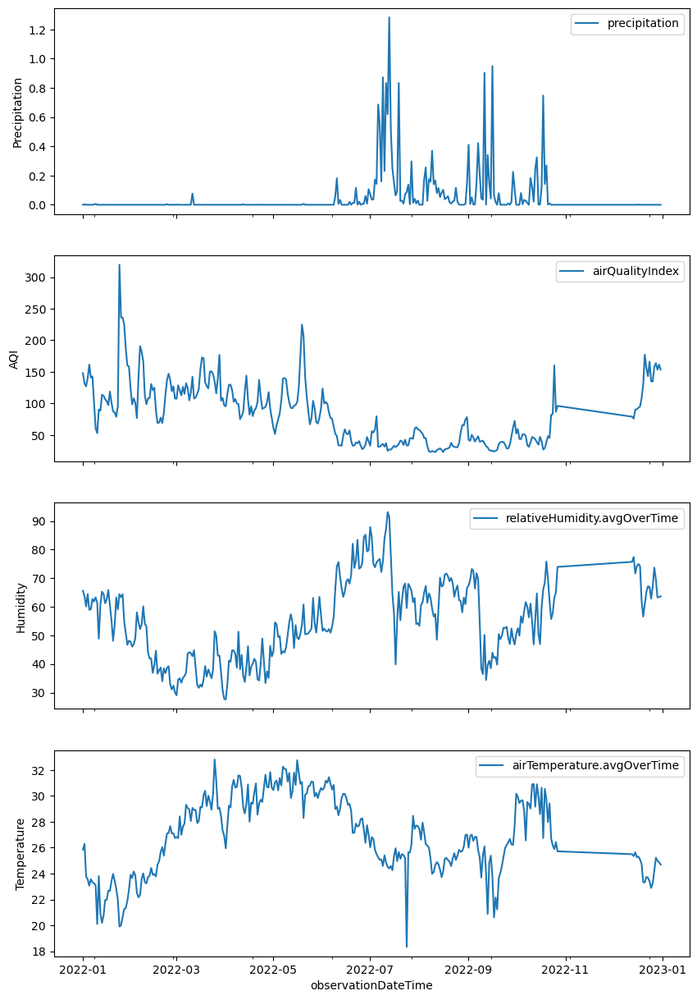

In [11]:
# Time series plot of precipitation, AQI, humidity & temparature
fig, ax = plt.subplots(4, 1, figsize=(10, 15), sharex=True)
plot_vars = [('precipitation', 'Precipitation'), ('airQualityIndex', 'AQI'), ('relativeHumidity.avgOverTime', 'Humidity'), ('airTemperature.avgOverTime', 'Temperature')]
for i, (var, ylabel) in enumerate(plot_vars):
    data.pivot_table(index='observationDateTime', values=var).plot(ax=ax[i])
    ax[i].set_ylabel(ylabel)
plt.show()

***Strting from January, till June, Pune barely experienced any rainfall and during that time this place suffered from high air qyality index. Similarly during the months of July, August and September Pune experienced a good amont of rainfall causing the downwards trend of air quality index. This observation clearly indicates towards the negative correlation between rainfall and air quality index that we'll see through further detailed analysis.***

### Widgets

In [12]:
prompt1=widgets.HTML(value="")
prompt2=widgets.HTML(value="")
gif_address = 'https://www.uttf.com.ua/assets/images/loader2.gif'

column_choice = ['precipitation', 'airQualityIndex', 'relativeHumidity.avgOverTime', 'airTemperature.avgOverTime', 'uv.avgOverTime']
time_range = pd.date_range(datetime(2022, 1, 1), datetime(2022, 12, 31), freq='D')
options = [time.strftime('%d %b') for time in time_range]

select_col = widgets.Dropdown(options=column_choice, value='precipitation', description='Property:', disabled=False)
select_time = widgets.SelectionSlider(options=options, value=options[-1], description='Time:', disabled=False, continuous_update=False, readout=True, width=1000)

ui = widgets.VBox([select_col, select_time], width=500)


### Interpolating precipitation readings across the city

In [13]:
def precipitation_contour(precipitation, time):
    prompt2.value = 'Building Contour ...'
    
    # GATHER THE REQUIRED DATA FOR THE CHOSEN TIME
    time = datetime.strptime(time + ', 2022', '%d %b, %Y').date()
    
    pp = data.pivot_table(index=['observationDateTime', 'deviceName'])
    pp.reset_index(inplace=True, level=['deviceName', 'observationDateTime'])
    pp = pp[pp.observationDateTime < time].sort_values(by='observationDateTime').drop_duplicates(['deviceName'], keep='last')
    
    data1 = pp.dropna(subset=[precipitation])
    readings = data1[precipitation]
    x = data1['longitude']
    y = data1['latitude']
    sensors = list(np.unique(data1.deviceName))
    
    # BUILDING A MESH GRID FOR A GIVEN RESOLUTION
    res = 500
    y_arr = np.linspace(np.min(y), np.max(y), res)
    x_arr = np.linspace(np.min(x), np.max(x), res)
    x_mesh, y_mesh = np.meshgrid(x_arr, y_arr)
    
    # PERFORM CUBIC INTERPOLATION
    interpolated_readings = griddata((x, y), readings, (x_mesh, y_mesh), method='cubic')
    
    # PLOT CONTOUR
    levels = 50
    contourf = plt.contourf(x_mesh, y_mesh, interpolated_readings, levels, alpha=0.5, cmap="bwr", linestyles='None', vmin=0)
    plt.close()
    
    # CONVERT CONTOUR TO GEOJSON REPRESENTATION
    geojson = geojsoncontour.contourf_to_geojson(contourf=contourf, min_angle_deg=3.0, ndigits=5, stroke_width=1, fill_opacity=0.5)
    
    sensors_map = folium.Map(tiles="cartodbpositron")
    sensors_map.add_child(plugins.HeatMap(df[['latitude', 'longitude']].values, radius=15))
    
    # PLOT CONTOUR ON MAP WITH FOLIUM 
    folium.GeoJson(
        geojson,
        style_function=lambda x: {
            'color': x['properties']['stroke'],
            'weight': x['properties']['stroke-width'],
            'fillColor': x['properties']['fill'],
            'opacity': 0.6,
        }
    ).add_to(sensors_map)
    
    sensors_map.fit_bounds(sensors_map.get_bounds())
    prompt2.value = str(time)
    
    display(sensors_map)


### Choose Date and Property to Visualize Locationwise Distribution

In [14]:
# Select the required property from the dropdown list and choose any date of 2022 to visualize the distribution of that property in Pune weather stations on that day.
display(ui)
widgets.interactive_output(precipitation_contour,{'precipitation':select_col,'time':select_time})

Output()

***An isohyet or isohyetal line is a line joining points of equal rainfall on a map in a given period. 
Here we can find places with same amount of rainfall for every day of 2022 with help of isohyet lines.
Blue lines indicates no rainfall and red lines indicates some amount of rainfall.***

## Correlation Analysis between Precipitation & AQI

In [15]:
# Format Date Time
data["observationDateTime"]=data['observationDateTime'].apply(lambda x:datetime.strptime(str(x),'%Y-%m-%d'))

### Visualizing the Trend

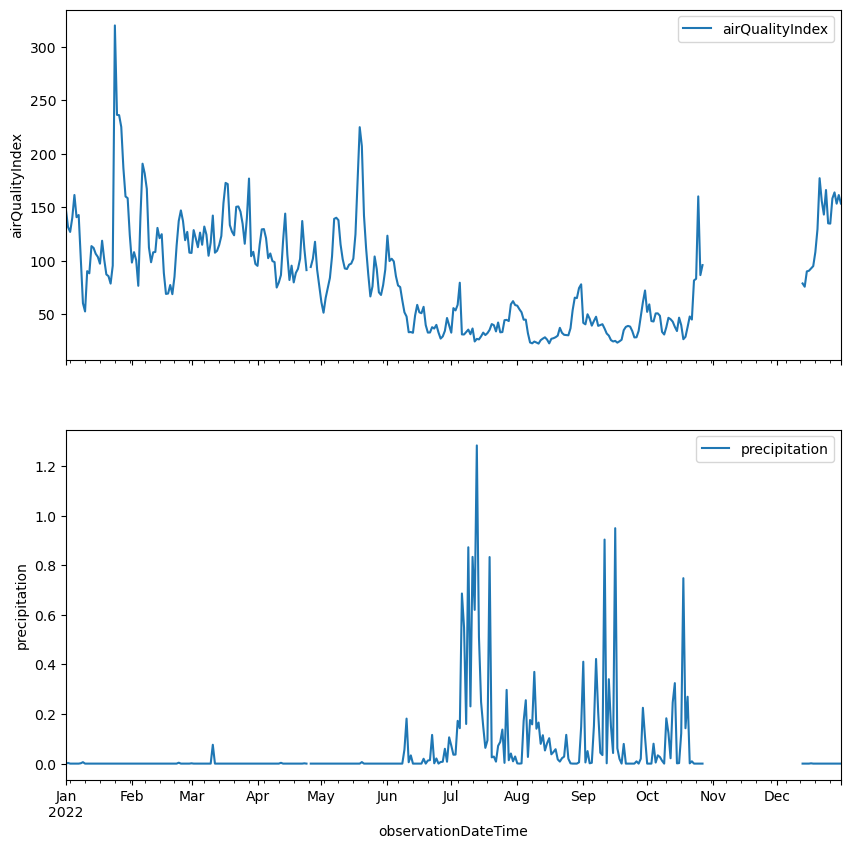

In [16]:
# Time series plot of daily averaged Precipitation & AQI data
fig, ax = plt.subplots(2, 1, figsize=(10, 10), sharex=True)
data.pivot_table(index='observationDateTime', values='airQualityIndex').resample('D').mean().plot(ax=ax[0])
ax[0].set_ylabel('airQualityIndex')
data.pivot_table(index='observationDateTime', values='precipitation').resample('D').mean().plot(ax=ax[1])
ax[1].set_ylabel('precipitation')
plt.show()

In [17]:
data[['precipitation', 'airQualityIndex']] = MinMaxScaler().fit_transform(data[['precipitation', 'airQualityIndex']])

# CHOOSE POLLUTANT AND SENSOR LABELS TO CHECK FOR CORRELATION
aqi = 'airQualityIndex'
pp = 'precipitation'

# PLOT
plt.figure(figsize=(30, 10), dpi=700)
plt.plot(data.observationDateTime, data[pp], label=pp)
plt.plot(data.observationDateTime, data[aqi], label=aqi)
plt.gcf().autofmt_xdate()
plt.title(f'Readings from {aqi} and {pp}')
plt.xlabel('Time')
plt.ylabel('Readings')
plt.legend()

plt.show()

***This trend points towards the negative correlation between precipitation and AQI***

### Annual Correlation

In [18]:
# Preparing necessary dataset
scaler = MinMaxScaler()
data2 = data[['precipitation', 'airQualityIndex', 'observationDateTime', 'deviceName']].copy()
data2[['precipitation', 'airQualityIndex']] = scaler.fit_transform(data2[['precipitation', 'airQualityIndex']].fillna(0))
data2['precipitation'] = data2['precipitation'].to_numpy().reshape(-1, 1)
data2['airQualityIndex'] = data2['airQualityIndex'].to_numpy().reshape(-1, 1)

In [19]:
u = data2['precipitation']
v = data2['airQualityIndex']
c = dcor.distance_correlation(u,v)
print("Distance Correlation between Precipitation and AQI of 2022 Pune Weather Data:", c)

Distance Correlation between Precipitation and AQI of 2022 Pune Weather Data: 0.1383108357155978


***Though it is evident that there is a correlation between AQI and precipitation, from this dataset we obtain below 15% of correlatoin. So, we go on even granular observation***

### Monthly Correlation

In [20]:
#Preparing necessary dataset

months = ['01', '02', '03', '04', '05', '06', '07', '08', '09', '10', '11', '12']
data_monthly = []

for month in months:
    start_date = f'2022-{month}-01'
    end_date = f'2022-{month}-' + str(calendar.monthrange(2022, int(month))[1])
    data_monthly.append(data2[(data2['observationDateTime'] >= start_date) & (data2['observationDateTime'] <= end_date)])

In [21]:
for i, monthly_data in enumerate(data_monthly):
    u = monthly_data['precipitation']
    v = monthly_data['airQualityIndex']
    month_name = calendar.month_name[i+1]
    print(f"{month_name}: {dcor.distance_correlation(u, v)}")

January: 0.012111896257252659
February: 0.014589618822643141
March: 0.020936304622599017
April: 0.015074292864414226
May: 0.023447799767945907
June: 0.05929696265770193
July: 0.14081360144113114
August: 0.1590093000801104
September: 0.06556374496670156
October: 0.05540850215633715
November: nan
December: 0.012755037983071338


***Monthwise correlation also seems to be very low for most of the months. Therefore we go for weekwise observation***

### Weekly Correlation

In [22]:
#Prepare necessary dataset
date = datetime.strptime('2022-01-01', '%Y-%m-%d')

d = pd.DataFrame(
    {'dt': [date + pd.Timedelta(days=7*i) for i in range(53)],
     'corr': [dcor.distance_correlation(data2[(data2['observationDateTime'] >= date + pd.Timedelta(days=7*i)) & (data2['observationDateTime'] <= date + pd.Timedelta(days=7*(i+1)))]['precipitation'],
                                        data2[(data2['observationDateTime'] >= date + pd.Timedelta(days=7*i)) & (data2['observationDateTime'] <= date + pd.Timedelta(days=7*(i+1)))]['airQualityIndex']) for i in range(53)]
    })

<Figure size 1000x1000 with 0 Axes>

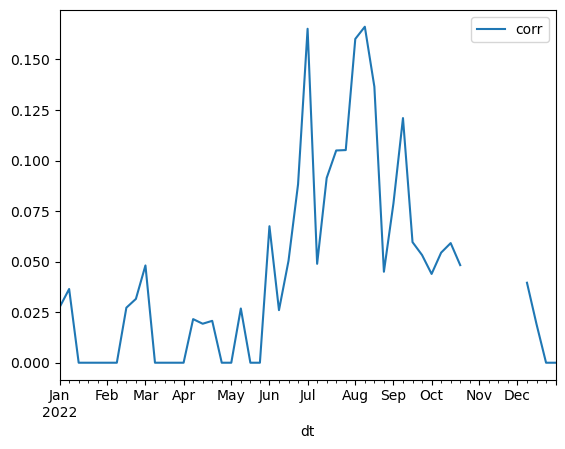

In [23]:
fig = plt.figure(figsize=(10,10))
d.plot(y='corr',x = 'dt')
plt.show()

***The correlation between Precipitation and AQI seems to be high during the months of July-September***

### Correlation on Weekly averaged data

In [24]:
#Prepare necessary dataset

data2 = data2.pivot_table(index='observationDateTime', values=['airQualityIndex','precipitation']).resample('7D').mean()
data2.reset_index(inplace = True)

In [25]:
# Pearson Correlation

data2[['airQualityIndex','precipitation']].corr(method = 'pearson')

,airQualityIndex,precipitation
airQualityIndex,1.000000,-0.510468
precipitation,-0.510468,1.000000


In [26]:
# Distance Correlation

data2['precipitation'] = data2['precipitation'].fillna(0)
data2['airQualityIndex'] = data2['airQualityIndex'].fillna(0)
u = data2['precipitation']
v = data2['airQualityIndex']
dcor.distance_correlation(u,v)

0.5378020479719791

***On weekly averaged data,***


***Pearson correlation between AQI and precipitation : -0.510408***


***Distance correlation between AQI and precipitation: 0.5371837844161262***

***AQI is expected to get increased due to the large amount of vehicles running on the roads and the factories running on working days. Therefore for observing the actual correlation we perform our analysis on sundays and public holidays of Pune.***

## Correlation between AQI and Precipitation on Holidays of 2022

### Holiday List of 2022

In [51]:
sunday = datetime.strptime('2022-01-02', '%Y-%m-%d')
holidays = [sunday + pd.Timedelta(days=7*i) for i in range(52)]
#public_holidays = ['2022-01-26', '2022-02-19', '2022-03-01', '2022-03-18', '2022-04-02', '2022-04-14', '2022-04-15', '2022-05-03', '2022-05-16', '2022-07-09', '2022-07-15', '2022-07-16', '2022-07-31', '2022-10-05', '2022-10-24', '2022-10-26', '2022-11-08']
#holidays += [datetime.strptime(date, '%Y-%m-%d') for date in public_holidays]
holidays.sort()

### Preparing Necessary Data

In [52]:
# Metadata for Precipitaion
df = pd.read_json("pune-env-weather.txt")
df['coordinates'] = [str(df['location'][i]['geometry']['coordinates']) for i in range(10)]
df['coordinates'] = df['coordinates'].astype(str)
df['latitude'] = df['coordinates'].apply(lambda x:float(x.split(",")[1][:-1].strip()))
df['longitude'] = df['coordinates'].apply(lambda x:float(x.split(",")[0][1:].strip()))
df = df.drop(['@context','type','label','description','tags','itemStatus','resourceGroup','provider','instance','_geosummary','location'], axis = 1)

# Precipitation data
ppt = pd.read_csv("data1.csv").iloc[78025:151434].reset_index(drop=True)
columns_to_drop = ["relativeHumidity", "airTemperature", "uv", "airQualityIndexForecast", "aqiMajorPollutantForecast", "airTemperatureForecast", "aqiMajorPollutant", "relativeHumidityForecast", "precipitationForecast", "airQualityIndex", "relativeHumidity.avgOverTime", "airTemperature.avgOverTime", "uv.avgOverTime", "deviceName"]
ppt = ppt.drop(columns_to_drop, axis=1)

# Date Time Format
ppt["observationDateTime"]=ppt['observationDateTime'].apply(lambda x:datetime.strptime(str(x),'%Y-%m-%d %H:%M:%S%z'))
ppt["observationDateTime"]=ppt['observationDateTime'].apply(lambda x:x.tz_localize(None))
ppt['observationDateTime'] = pd.to_datetime(ppt["observationDateTime"]).dt.normalize()
ppt = ppt[ppt['observationDateTime'].isin (holidays)]
ppt.reset_index(inplace = True)

#Combining metadata with precipitation data
ppt['latitude'] = ppt['id'].apply(lambda x: df.loc[df['id'] == x, 'latitude'].values[0] if x in df['id'].values else '')
ppt['longitude'] = ppt['id'].apply(lambda x: df.loc[df['id'] == x, 'longitude'].values[0] if x in df['id'].values else '')

ppt = ppt.groupby(['latitude','longitude','observationDateTime'])['precipitation'].mean().reset_index(name ='precipitation')

ppt['precipitation'] = ppt['precipitation'].fillna(0)

ppt = ppt.sort_values(by = 'observationDateTime')

#ppt = ppt.groupby('observationDateTime').filter(lambda x: x['precipitation'].any() != 0)

ppt.reset_index(inplace = True)
ppt = ppt.drop(['index'], axis = 1)

In [53]:
# AQM metadata
df = pd.read_json("pune-env-aqm.txt")
df['coordinates'] = [str(df['location'][i]['geometry']['coordinates']) for i in range(50)]
df['coordinates'] = df['coordinates'].astype(str)
df['latitude']=df['coordinates'].apply(lambda x:float(x.split(",")[1][:-1].strip()))
df['longitude']=df['coordinates'].apply(lambda x:float(x.split(",")[0][1:].strip()))
df = df.drop(['name','deviceInfo','itemCreatedAt','@context','type','label','description','tags','itemStatus','resourceGroup','provider','instance','_geosummary','location'], axis = 1)

#AQM data
aqm = pd.read_csv("aqm.csv")
aqm = aqm.drop(['Unnamed: 0','airQualityLevel','deviceStatus','uv.avgOverTime','o3.avgOverTime','pm2p5.avgOverTime','co2.avgOverTime','pm10.avgOverTime','co.avgOverTime','no2.avgOverTime','airTemperature.avgOverTime','illuminance.avgOverTime','ambientNoise.avgOverTime','so2.avgOverTime','relativeHumidity.avgOverTime','atmosphericPressure.avgOverTime'], axis = 1)

#Date time format
aqm["observationDateTime"]=aqm['observationDateTime'].apply(lambda x:datetime.strptime(str(x),'%Y-%m-%d %H:%M:%S%z'))
aqm["observationDateTime"]=aqm['observationDateTime'].apply(lambda x:x.tz_localize(None))
aqm['observationDateTime'] = pd.to_datetime(aqm["observationDateTime"]).dt.normalize()
aqm = aqm[aqm['observationDateTime'].isin (holidays)]

aqm = aqm.groupby(['id','observationDateTime'])['airQualityIndex'].mean().reset_index(name ='airQualityIndex')

# Combining metadata with aqm data
aqm['latitude'] = aqm.apply(lambda row: df.loc[df['id'] == row['id'], 'latitude'].values[0] if row['id'] in df['id'].values else '', axis=1)
aqm['longitude'] = aqm.apply(lambda row: df.loc[df['id'] == row['id'], 'longitude'].values[0] if row['id'] in df['id'].values else '', axis=1)
aqm['coordinates'] = aqm.apply(lambda row: df.loc[df['id'] == row['id'], 'coordinates'].values[0] if row['id'] in df['id'].values else '', axis=1)
            
aqm['airQualityIndex'] = aqm['airQualityIndex'].fillna(0)

#aqm = aqm.groupby('observationDateTime').filter(lambda x: x['airQualityIndex'].any() != 0)
aqm = aqm.sort_values(by = 'observationDateTime')

aqm.reset_index(inplace = True)
aqm = aqm.drop(['index','id','coordinates'], axis = 1)

In [54]:
# Getting common dates from aqm and precipitation data
ppt_dates = list(ppt['observationDateTime'].unique())
aqm_dates = list(aqm['observationDateTime'].unique())
common_dates = [i for i in ppt_dates if i in aqm_dates]

In [55]:
ppt = ppt[ppt['observationDateTime'].isin (common_dates)]
ppt.reset_index(inplace = True)
ppt = ppt.drop(['index'], axis = 1)

aqm = aqm[aqm['observationDateTime'].isin (common_dates)]
aqm.reset_index(inplace = True)
aqm = aqm.drop(['index'], axis = 1)

### Choose one holiday

In [195]:
# Change the index of common_dates (0 to 20) to selct a particular holiday
# The study provided below pertains to the 10th of July, 2022, which was a holiday for both Sunday and Bakrid/Eid al Adha

ppt1 = ppt[ppt['observationDateTime'] == common_dates[7]]
aqm1= aqm[aqm['observationDateTime'] == common_dates[7]]
ppt1.reset_index(inplace = True)

aqm1.reset_index(inplace = True)

### Extract Property and Location Data from Both Dataset

In [57]:
#@title
# Gathering Precipitation data and location data
readings1 = ppt1['precipitation']
x1 = ppt1['longitude']
y1 = ppt1['latitude']

# Gathering AQI data and location data
readings2 = aqm1['airQualityIndex']
x2 = aqm1['longitude']
y2 = aqm1['latitude']

res = 50 # Number of rows and columns of the grid

# Creating Rows and Columns of squares within the location range
y_arr = np.linspace(np.min(y2), np.max(y1), res)
x_arr = np.linspace(np.min(x1), np.max(x1), res)

x_mesh, y_mesh = np.meshgrid(x_arr, y_arr)

# List of longitudes of the 2500 squares
x = [i for i in x_mesh[0]]

# List of latitudes of the 2500 squares
y = [y_mesh[i][0] for i in range(50)]

# List of (longitude, latitude) of the 2500 squares
points = [(x[i], y[j]) for i in range(50) for j in range(50)]

### Krigged Interpolated Readings for Correlation

In [58]:
# Applying Krig Interpolation on Precipitation readings
coords1 = [[ppt1['latitude'][i], ppt1['longitude'][i]] for i in range(len(ppt1))]
vario1 = Variogram(coordinates=coords1,
                  values=readings1)
OK = OrdinaryKriging(
    np.array(x1),
    np.array(y1),
    readings1,
    variogram_model = "exponential",
    variogram_parameters = {'sill': vario1.describe()["sill"], 'range': vario1.describe()["effective_range"],
                            'nugget': vario1.describe()["nugget"]},
    verbose = True,
    enable_plotting = False,
    coordinates_type = "geographic",
    exact_values = False,
    nlags = 20)
field1, sigma_squared_p_krig1 = OK.execute("grid", x_arr,y_arr)

# Applying Krig Interpolation on AQI readings
coords2 = [[aqm1['latitude'][i], aqm1['longitude'][i]] for i in range(len(aqm1))]
vario2 = Variogram(coordinates=coords2,
                  values = readings2) 
OK = OrdinaryKriging(
    np.array(x2),
    np.array(y2),
    readings2,
    variogram_model = "exponential",
    variogram_parameters = {'sill': vario2.describe()["sill"], 'range': vario2.describe()["effective_range"],
                            'nugget': vario2.describe()["nugget"]},
    verbose = True,
    enable_plotting = False,
    coordinates_type = "geographic",
    exact_values = False,
    nlags = 20)
field2, sigma_squared_p_krig2 = OK.execute("grid", x_arr,y_arr)

# Normalize the interpolated readings and Take differential of the readings
scaler = MinMaxScaler()
interpolated_readings1 = np.diff(scaler.fit_transform(field1))
interpolated_readings2 = np.diff(scaler.fit_transform(field2))

# Correlation between the differentitaed interpolated precipitation and AQI readings
correlation = [pd.Series(interpolated_readings1[i]).corr(pd.Series(interpolated_readings2[j])) for i in range(50) for j in range(50)]
correlation = pd.Series(correlation)

Initializing variogram model...
Coordinates type: 'geographic' 

Using 'exponential' Variogram Model
Partial Sill: 0.0019266533551874862
Full Sill: 0.0019266533551874862
Range: 0.010201079787658093
Nugget: 0 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...

Initializing variogram model...
Coordinates type: 'geographic' 

Using 'exponential' Variogram Model
Partial Sill: 417.1511697315758
Full Sill: 417.1511697315758
Range: 0.025462480439763655
Nugget: 0 

Calculating statistics on variogram model fit...
Executing Ordinary Kriging...



### Make the Grid

In [59]:
# Creating Voronoi Diagram to get the 50x50 grid
long = [np.min(x1), np.min(x1), np.max(x1), np.max(x1)]
lat = [np.min(y2), np.max(y1), np.max(y1), np.min(y2)]

polygon_geom = Polygon(zip(long, lat))

boundary = gpd.GeoDataFrame()
boundary = boundary.append({'geometry': polygon_geom}, ignore_index=True)

gdf = gpd.GeoDataFrame()
for i in points:
    gdf = gdf.append({'geometry': Point(i)}, ignore_index=True)

gdf.crs = {'init' :'epsg:3395'}
boundary.crs = {'init' :'epsg:3395'}

boundary_shape = cascaded_union(boundary.geometry)
coords = points_to_coords(gdf.geometry)

poly_shapes, pts = voronoi_regions_from_coords(coords, boundary_shape)

# Create a geodataframe for each small square with correlaion value and corresponding color
gdf = gpd.GeoDataFrame()
for i in range(0,len(poly_shapes)):
    gdf = gdf.append({'geometry': poly_shapes[i]}, ignore_index=True)

gdf['voronoi_region'] = list(range(2500))
gdf['corr'] = correlation[:2500]
    
gdf = gdf.sort_values(by = 'corr')
gdf.reset_index(inplace = True)

k = list(gdf['corr'].unique())
palette = list(reversed(sns.color_palette("Spectral_r", len(k)).as_hex()))

for i, value in enumerate(k):
    gdf.loc[gdf['corr'] == value, 'color'] = palette[i]


### Visualizing the colour coded correlation between precipitation and AQI on a particular day

In [199]:
m = folium.Map([18.4,73.6],tiles='cartodbpositron')

for x in range(len(gdf)):
    color = gdf['color'][x]  # Get the color for the current voronoi diagram
    folium.GeoJson(
        gdf['geometry'][x],
        style_function=lambda y, col=color: {  # Assign the color to a new variable `col`
            'fillColor': col,  
            'color': "#000000",
            'weight': 1,
            'opacity': 1,
            'fillOpacity': 0.8
        }
    ).add_to(m)
for i in range(len(coords2 + coords1)):
    folium.Marker(coords2[i] if i < len(coords2) else coords1[i - len(coords2)]).add_to(m)

m

***The more the color is close to red, the more is the negative correlation between AQI and precipitation and the more the color is towards blue, the more is the positive correlation between precipitation and AQI.***

***We see the majority of reddish squares in every plot which proves the negative correlation***


**As we are aware, precipitation has an effect on air quality, when there is a lot of precipitation, the concentration of pollutants in the air is low because precipitation speeds up the diffusion of pollutants in the air. When there is no precipitation, the pollutants are more likely to accumulate and the air quality is poor. As a result, in conditions with more severe air pollution, the air quality can be improved by increasing the amount of precipitation.**

**From our Analysis it is evident that Precipitation has a high influence on Air Quality Index and it has a high impact on controlling the increasing AQI of Pune city.**

## Finding the Primary Source of Pollution in Pune

In [56]:
# Prepare necessary dataset
ppt1 = ppt.pivot_table(index=['latitude','longitude'], values=['precipitation'])
ppt1.reset_index(inplace = True)
aqm1 = aqm.pivot_table(index=['latitude','longitude'], values=['airQualityIndex'])
aqm1.reset_index(inplace = True)

# Run the previous 3 cells titled "Extract Property and Location Data from Both Dataset", "Krigged Interpolated Readings for Correlation","Make the Grid", for gathering proper data for the needed plot after this

### Plot for All Holidays 

In [50]:
#All holidays
m = folium.Map([18.4,73.6],tiles='cartodbpositron')

for x in range(len(gdf)):
    color = gdf['color'][x]  # Get the color for the current voronoi diagram
    folium.GeoJson(
        gdf['geometry'][x],
        style_function=lambda y, col=color: {  # Assign the color to a new variable `col`
            'fillColor': col,  
            'color': "#000000",
            'weight': 1,
            'opacity': 1,
            'fillOpacity': 0.8
        }
    ).add_to(m)
for i in range(len(coords2 + coords1)):
    folium.Marker(coords2[i] if i < len(coords2) else coords1[i - len(coords2)]).add_to(m)

m

### Plot for Only Sundays

In [60]:
#Only sundays
m = folium.Map([18.4,73.6],tiles='cartodbpositron')

for x in range(len(gdf)):
    color = gdf['color'][x]  # Get the color for the current voronoi diagram
    folium.GeoJson(
        gdf['geometry'][x],
        style_function=lambda y, col=color: {  # Assign the color to a new variable `col`
            'fillColor': col,  
            'color': "#000000",
            'weight': 1,
            'opacity': 1,
            'fillOpacity': 0.8
        }
    ).add_to(m)
for i in range(len(coords2 + coords1)):
    folium.Marker(coords2[i] if i < len(coords2) else coords1[i - len(coords2)]).add_to(m)

m

***We can observe from the above two plots that the squares in few places in Pune is having bright purple color in the plot for only sundays but comparatively light colors in the plot for all the holidays, meaning that precipitation is greatly affecting the AQI on Sundays but not on other holidays.***

**With the fact that sundays are holidays for most job sectors in Pune and hence vehicular pollution is expected to low down on sundays, it can be concluded from our analysis that the transportation sector is primary responsible for the air pollution in Pune.**

## Impact in Urban Policy Making:
***Integrated Air Quality and Weather Forecasting:*** **Integrating air quality monitoring systems with weather forecasting models can provide valuable insights for implementing targeted measures. When precipitation is predicted, proactive measures can be taken to mitigate pollutant emissions and reduce the impact of pollutants on air quality.One such proactive measure for the factories can be storing the air pollutants and emit them into air when it rains.**

***Urban Planning and Green Infrastructure:*** **Motivating the urban policy makers to incorporate green infrastructure, such as parks, green spaces, and vegetation, in urban planning can promote rainfall retention and infiltration. This helps to enhance natural precipitation patterns, reduce runoff, and improve air quality by reducing pollutants.**